In [432]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, scale
from sklearn.decomposition import PCA
import plotly.express as px
import plotly.offline as pyo
import matplotlib.pyplot as plt
from sklearn import preprocessing

In [433]:
# Set notebook mode to work in offline
pyo.init_notebook_mode()

In [434]:
df = pd.read_csv('../data/features_3_sec.csv')
df['label'] = df['label'].astype('category')
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [435]:
df['label'].unique()

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
Categories (10, object): ['blues', 'classical', 'country', 'disco', ..., 'metal', 'pop', 'reggae', 'rock']

In [436]:
df['label'].value_counts()

blues        1000
jazz         1000
metal        1000
pop          1000
reggae       1000
disco         999
classical     998
hiphop        998
rock          998
country       997
Name: label, dtype: int64

### Datos originales

In [437]:
x = df.loc[:, 'chroma_stft_mean':'mfcc20_var']
y  = df['label'].cat.codes.values

In [438]:
columnas = x.columns
columnas

Index(['chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
       'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var'],
      dtype='object')

In [464]:
enconding = preprocessing.LabelEncoder()
df['label_econd']= enconding.fit_transform(df['label'])
df['label_econd'] = df['label_econd'].astype('category')
array_category = df['label'].unique().astype(str)
dict_category = dict(enumerate(array_category, 0))
dict_category

{0: 'blues',
 1: 'classical',
 2: 'country',
 3: 'disco',
 4: 'hiphop',
 5: 'jazz',
 6: 'metal',
 7: 'pop',
 8: 'reggae',
 9: 'rock'}

## Datos normalizados sin outliers

In [451]:
scaler = MinMaxScaler()
x_norm = scaler.fit_transform(x)

data = df.iloc[:,2:-2]
data_norm = scaler.fit_transform(data)

In [440]:
def mahalanobis(x=None, data=None, cov=None):

    x_mu = x - np.mean(data)
    #if not cov:
        #cov = np.cov(x.T)
    inv_cov = np.linalg.inv(cov)
    mahalanobis_distances = np.diag(np.dot((x_mu @ inv_cov), x_mu.T))
   
    return mahalanobis_distances

In [441]:
cov_h_norm = np.cov(x_norm.T)

#Mejorar la matriz de covarianzas

cov_i_norm = cov_h_norm + 10*np.eye(57, 57) ## ¿Cómo determinamos lamda?
cond_i_norm = np.linalg.cond(cov_i_norm)
det_i_norm = np.linalg.det(cov_i_norm)

In [442]:
mahalanobis_dis_i_norm = mahalanobis(x=x_norm, data=data_norm, cov=cov_i_norm)

x_ot = x_norm[mahalanobis_dis_i_norm < 0.4]
y_ot = y[mahalanobis_dis_i_norm < 0.4]

In [465]:
cols = df.loc[:, 'chroma_stft_mean':'mfcc20_var'].columns
df_out = pd.DataFrame(x_ot,columns=cols)
df_out['label_encond'] = y_ot
df_out['label_encond'] = df_out['label_encond'].astype('category')

In [468]:
x_out = df_out.loc[:, 'chroma_stft_mean':'mfcc20_var']
y_out  = df_out['label_encond'].cat.codes.values

df_out['label'] = (df_out['label_encond'].map(dict_category))

In [469]:
df_out.head(2)

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label_encond,label
0,0.355399,0.716757,0.293133,0.107955,0.262173,0.034784,0.459205,0.094130,0.346153,0.083164,...,0.397172,0.066062,0.371828,0.055344,0.380831,0.026797,0.506746,0.047781,0,blues
1,0.367322,0.670347,0.253040,0.044447,0.270969,0.018716,0.470831,0.052261,0.363722,0.051694,...,0.351681,0.074001,0.362068,0.076365,0.418452,0.082414,0.593029,0.065548,0,blues


## PCA para visualizar los clusters

In [470]:
pca = PCA(n_components=3)

In [471]:
values = df.loc[:, 'chroma_stft_mean':'mfcc20_var'].values
values = scaler.fit_transform(values)

In [472]:
df[['pca1', 'pca2', 'pca3']] = pca.fit_transform(values)

In [473]:
fig = px.scatter_3d(df, x='pca1', y='pca2', z='pca3', color='label')
fig.update_traces(marker=dict(size=4))
fig.show()

# 1.K-means

In [474]:
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min

### 1.1 Con los datos originales

In [475]:
Sum_of_squared_distances = [] 
K = range (1,15) 
for k in K: 
    km = KMeans(n_clusters = k) 
    km = km.fit(x) 
    Sum_of_squared_distances.append(km.inertia_)

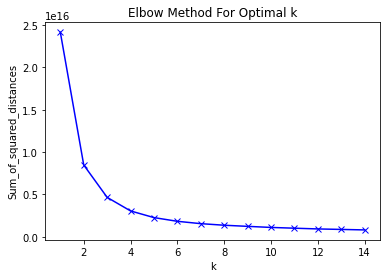

In [476]:
plt.plot(K, Sum_of_squared_distances, 'bx-') 
plt.xlabel('k') 
plt.ylabel('Sum_of_squared_distances') 
plt.title('Elbow Method For Optimal k') 
plt.show()

In [477]:
kmeans = KMeans(n_clusters=10, random_state=10,n_init = 10).fit(x)

In [478]:
##
## Número de registros asignados a cada cluster
##
count_cluster = ((pd.DataFrame(kmeans.predict(x)))[0].value_counts()).to_dict()
count_cluster

{4: 2534,
 9: 2331,
 0: 1685,
 6: 1255,
 2: 836,
 8: 505,
 1: 334,
 3: 263,
 7: 180,
 5: 67}

In [479]:
labels = kmeans.predict(x)
df['kmeans_org'] = labels
df['kmeans_org'] = df['kmeans_org'].astype('category')
#df.insert(59, 'kmeans_org', labels)

In [480]:
enconding = preprocessing.LabelEncoder()
df['label_econd']= enconding.fit_transform(df['label'])
df['label_econd'] = df['label_econd'].astype('category')
(df['label_econd'].astype(str) + '-' + df['label'].astype(str)).unique()

array(['0-blues', '1-classical', '2-country', '3-disco', '4-hiphop',
       '5-jazz', '6-metal', '7-pop', '8-reggae', '9-rock'], dtype=object)

In [481]:
(df['kmeans_org'].astype(str) + '-' + df['label'].astype(str)).unique()

array(['9-blues', '0-blues', '4-blues', '2-blues', '6-blues', '8-blues',
       '3-blues', '1-blues', '7-blues', '4-classical', '9-classical',
       '6-classical', '0-classical', '7-classical', '2-classical',
       '8-classical', '5-classical', '6-country', '9-country',
       '0-country', '4-country', '3-country', '2-country', '8-country',
       '1-country', '7-country', '1-disco', '8-disco', '2-disco',
       '6-disco', '0-disco', '9-disco', '4-disco', '3-disco', '7-disco',
       '5-disco', '9-hiphop', '4-hiphop', '6-hiphop', '0-hiphop',
       '3-hiphop', '2-hiphop', '8-hiphop', '1-hiphop', '7-hiphop',
       '5-hiphop', '2-jazz', '9-jazz', '6-jazz', '4-jazz', '0-jazz',
       '8-jazz', '3-jazz', '1-jazz', '5-jazz', '7-jazz', '0-metal',
       '9-metal', '4-metal', '2-metal', '8-metal', '3-metal', '6-metal',
       '6-pop', '0-pop', '3-pop', '7-pop', '4-pop', '1-pop', '9-pop',
       '2-pop', '8-pop', '5-pop', '0-reggae', '9-reggae', '6-reggae',
       '2-reggae', '8-reggae', '1

In [482]:
## Mirar en cuantos cluster está cada genero musical

df_a = pd.DataFrame((df['kmeans_org'].astype(str) + '-' + df['label'].astype(str)).unique())
new = df_a[0].str.split("-", n = 2, expand = True)
df_a['cluster']= new[0].astype(int)
df_a['category']= new[1].astype('category')

df_a = df_a.groupby(df_a['category']).count()
df_a = df_a.drop(['cluster'], axis=1)
df_a.columns = ['Cantidad_clusters']
df_a

,Cantidad_clusters
category,
blues,9
classical,8
country,9
disco,10
hiphop,10
jazz,10
metal,7
pop,10
reggae,10


In [483]:
df_kmeans_org = pd.DataFrame(df['filename'].groupby(df['kmeans_org'].astype(str) + '-' + df['label'].astype(str)).nunique())
df_kmeans_org.reset_index(inplace = True)

new = df_kmeans_org['index'].str.split("-", n = 2, expand = True)
df_kmeans_org['cluster_kmeans_org']= new[0].astype(int)
df_kmeans_org['category']= new[1].astype('category')


df_kmeans_org = df_kmeans_org.sort_values(["cluster_kmeans_org","filename"], ascending = (True,False))

df_kmeans_org['cluster_kmeans_org']= df_kmeans_org['cluster_kmeans_org'].astype('category')

df_kmeans_org['cantidadxcluster'] = (df_kmeans_org['cluster_kmeans_org'].map(count_cluster)).astype(int)

df_kmeans_org['proporcion_genero_cluster'] = (df_kmeans_org['filename']/df_kmeans_org['cantidadxcluster'])

df_kmeans_org.head()

,index,filename,cluster_kmeans_org,category,cantidadxcluster,proporcion_genero_cluster
3,0-disco,283,0,disco,1685,0.167953
2,0-country,257,0,country,1685,0.152522
9,0-rock,228,0,rock,1685,0.135312
4,0-hiphop,185,0,hiphop,1685,0.109792
5,0-jazz,178,0,jazz,1685,0.105638


In [484]:
## Cual es el genero principal de cada cluster, y comparar cuál sería el original
df_comp = df_kmeans_org.copy()
df_comp.drop_duplicates(subset='cluster_kmeans_org', keep = 'first', inplace=True)
df_comp['original'] = (df['label_econd'].astype(str) + '-' + df['label'].astype(str)).unique()
df_comp

,index,filename,cluster_kmeans_org,category,cantidadxcluster,proporcion_genero_cluster,original
3,0-disco,283,0,disco,1685,0.167953,0-blues
16,1-reggae,94,1,reggae,334,0.281437,1-classical
26,2-reggae,186,2,reggae,836,0.222488,2-country
34,3-pop,110,3,pop,263,0.418251,3-disco
38,4-classical,869,4,classical,2534,0.342936,4-hiphop
52,5-reggae,18,5,reggae,67,0.268657,5-jazz
61,6-pop,201,6,pop,1255,0.160159,6-metal
68,7-hiphop,52,7,hiphop,180,0.288889,7-pop
81,8-reggae,151,8,reggae,505,0.299010,8-reggae
83,9-blues,349,9,blues,2331,0.149721,9-rock


In [485]:
# Centroids de los cluster 

centroids = kmeans.cluster_centers_
df_centroids_org= pd.DataFrame(centroids, columns = columnas)

### 1.1.1 Resumen resultados

In [486]:
df_re_kmeans_org = pd.DataFrame(df_kmeans_org[['category','cluster_kmeans_org','proporcion_genero_cluster']])

df_re_kmeans_org['cluster_kmeans_org']= df_re_kmeans_org['cluster_kmeans_org'].astype('category')

df_re_kmeans_org.head()

,category,cluster_kmeans_org,proporcion_genero_cluster
3,disco,0,0.167953
2,country,0,0.152522
9,rock,0,0.135312
4,hiphop,0,0.109792
5,jazz,0,0.105638


In [501]:
fig = px.bar(y=df_re_kmeans_org['proporcion_genero_cluster'], x=df_re_kmeans_org['cluster_kmeans_org'], 
             title='Proporción de genéros por cluster, K-means_org', labels={'x': 'Cluster', 'y': 'Proporcionxgenero'},
             color=df_re_kmeans_org['category'])
fig.update_layout(title_font_size=35)
fig.update_xaxes(tickangle=-30)
fig.show()

In [488]:
fig = px.scatter_3d(df, x='pca1', y='pca2', z='pca3', color='kmeans_org')
fig.update_traces(marker=dict(size=4))
fig.show()

# 1.2 Con los datos normalizados sin outliers

In [489]:
kmeans_2 = KMeans(n_clusters=10, random_state=10,n_init = 10).fit(x_out)

In [490]:
##
## Número de registros asignados a cada cluster
##
count_cluster = ((pd.DataFrame(kmeans_2.predict(x_out)))[0].value_counts()).to_dict()
count_cluster

{0: 1338,
 7: 1307,
 9: 1292,
 3: 1235,
 1: 1060,
 4: 869,
 2: 847,
 8: 728,
 5: 695,
 6: 533}

In [491]:
labels_out = kmeans_2.predict(x_out)
df_out['kmeans_out'] = labels_out
df_out['kmeans_out'] = df_out['kmeans_out'].astype('category')

In [492]:
enconding = preprocessing.LabelEncoder()
df_out['label_econd']= enconding.fit_transform(df_out['label'])
df_out['label_econd'] = df_out['label_econd'].astype('category')
(df_out['label_econd'].astype(str) + '-' + df_out['label'].astype(str)).unique()

array(['0-blues', '1-classical', '2-country', '3-disco', '4-hiphop',
       '5-jazz', '6-metal', '7-pop', '8-reggae', '9-rock'], dtype=object)

In [493]:
(df_out['kmeans_out'].astype(str) + '-' + df_out['label'].astype(str)).unique()

array(['9-blues', '4-blues', '1-blues', '5-blues', '6-blues', '0-blues',
       '8-blues', '6-classical', '5-classical', '1-classical',
       '9-classical', '3-classical', '7-classical', '4-classical',
       '7-country', '3-country', '8-country', '1-country', '4-country',
       '2-country', '9-country', '5-country', '6-country', '0-country',
       '2-disco', '3-disco', '7-disco', '1-disco', '9-disco', '5-disco',
       '6-disco', '0-disco', '8-disco', '4-disco', '0-hiphop', '8-hiphop',
       '4-hiphop', '2-hiphop', '9-hiphop', '5-hiphop', '1-hiphop',
       '3-hiphop', '7-hiphop', '3-jazz', '5-jazz', '1-jazz', '6-jazz',
       '9-jazz', '4-jazz', '0-jazz', '2-jazz', '7-jazz', '7-metal',
       '0-metal', '3-metal', '8-metal', '1-metal', '9-metal', '4-metal',
       '5-metal', '2-pop', '7-pop', '3-pop', '1-pop', '4-pop', '5-pop',
       '9-reggae', '4-reggae', '1-reggae', '0-reggae', '8-reggae',
       '6-reggae', '3-reggae', '2-reggae', '7-reggae', '5-reggae',
       '8-rock', '9-

In [494]:
## Mirar en cuantos cluster está cada genero musical

df_a = pd.DataFrame((df_out['kmeans_out'].astype(str) + '-' + df_out['label'].astype(str)).unique())
new = df_a[0].str.split("-", n = 2, expand = True)
df_a['cluster']= new[0].astype(int)
df_a['category']= new[1].astype('category')

df_a = df_a.groupby(df_a['category']).count()
df_a = df_a.drop(['cluster'], axis=1)
df_a.columns = ['Cantidad_clusters']
df_a

,Cantidad_clusters
category,
blues,7
classical,7
country,10
disco,10
hiphop,9
jazz,9
metal,8
pop,6
reggae,10


In [496]:
df_kmeans_out = pd.DataFrame(df['filename'].groupby(df_out['kmeans_out'].astype(str) + '-' + 
                                                    df_out['label'].astype(str)).nunique())
df_kmeans_out.reset_index(inplace = True)

new = df_kmeans_out['index'].str.split("-", n = 2, expand = True)
df_kmeans_out['cluster_kmeans_out']= new[0].astype(int)
df_kmeans_out['category']= new[1].astype('category')


df_kmeans_out = df_kmeans_out.sort_values(["cluster_kmeans_out","filename"], ascending = (True,False))

df_kmeans_out['cluster_kmeans_out']= df_kmeans_out['cluster_kmeans_out'].astype('category')

df_kmeans_out['cantidadxcluster'] = (df_kmeans_out['cluster_kmeans_out'].map(count_cluster)).astype(int)

df_kmeans_out['proporcion_genero_cluster'] = (df_kmeans_out['filename']/df_kmeans_out['cantidadxcluster'])

df_kmeans_out.head()

,index,filename,cluster_kmeans_out,category,cantidadxcluster,proporcion_genero_cluster
5,0-metal,668,0,metal,1338,0.499253
2,0-disco,216,0,disco,1338,0.161435
7,0-rock,211,0,rock,1338,0.157698
3,0-hiphop,119,0,hiphop,1338,0.088939
0,0-blues,97,0,blues,1338,0.072496


In [497]:
## Cual es el genero principal de cada cluster, y comparar cuál sería el original
df_comp = df_kmeans_out.copy()
df_comp.drop_duplicates(subset='cluster_kmeans_out', keep = 'first', inplace=True)
df_comp['original'] = (df_out['label_econd'].astype(str) + '-' + df_out['label'].astype(str)).unique()
df_comp

,index,filename,cluster_kmeans_out,category,cantidadxcluster,proporcion_genero_cluster,original
5,0-metal,668,0,metal,1338,0.499253,0-blues
10,1-country,274,1,country,1060,0.258491,1-classical
22,2-pop,410,2,pop,847,0.484061,2-country
32,3-reggae,302,3,reggae,1235,0.244534,3-disco
42,4-reggae,336,4,reggae,869,0.386651,4-hiphop
45,5-classical,495,5,classical,695,0.712230,5-jazz
55,6-classical,349,6,classical,533,0.654784,6-metal
67,7-pop,379,7,pop,1307,0.289977,7-pop
74,8-metal,205,8,metal,728,0.281593,8-reggae
85,9-rock,275,9,rock,1292,0.212848,9-rock


In [498]:
centroids2 = kmeans_2.cluster_centers_
df_centroids_out= pd.DataFrame(centroids2, columns = columnas)

### 1.2.1 Resumen resultados

In [499]:
df_re_kmeans_out = pd.DataFrame(df_kmeans_out[['category','cluster_kmeans_out','proporcion_genero_cluster']])

df_re_kmeans_out['cluster_kmeans_out']= df_re_kmeans_out['cluster_kmeans_out'].astype('category')

df_re_kmeans_out.head()

,category,cluster_kmeans_out,proporcion_genero_cluster
5,metal,0,0.499253
2,disco,0,0.161435
7,rock,0,0.157698
3,hiphop,0,0.088939
0,blues,0,0.072496


In [502]:
fig = px.bar(y=df_re_kmeans_out['proporcion_genero_cluster'], x=df_re_kmeans_out['cluster_kmeans_out'], 
             title='Proporción de genéros por cluster, K-means_out', labels={'x': 'Cluster', 'y': 'Proporcionxgenero'},
             color=df_re_kmeans_out['category'])
fig.update_layout(title_font_size=35)
fig.update_xaxes(tickangle=-30)
fig.show()

In [503]:
values = df_out.loc[:, 'chroma_stft_mean':'mfcc20_var'].values
values = scaler.fit_transform(values)

In [504]:
df_out[['pca1', 'pca2', 'pca3']] = pca.fit_transform(values)

In [505]:
fig = px.scatter_3d(df_out, x='pca1', y='pca2', z='pca3', color='kmeans_out')
fig.update_traces(marker=dict(size=4))
fig.show()

### 1.3 Con datos normalizados

In [160]:
kmeans_3 = KMeans(n_clusters=10, random_state=10,n_init = 10).fit(x_norm)

In [506]:
count_cluster = ((pd.DataFrame(kmeans_3.predict(x_norm)))[0].value_counts()).to_dict()
count_cluster

{2: 1706,
 3: 1551,
 0: 1138,
 6: 1046,
 7: 890,
 5: 887,
 1: 812,
 4: 729,
 9: 698,
 8: 533}

In [507]:
labels_norm = kmeans_3.predict(x_norm)
df['kmeans_norm'] = labels_norm
df['kmeans_norm'] = df['kmeans_norm'].astype('category')

In [508]:
(df['kmeans_norm'].astype(str) + '-' + df['label'].astype(str)).unique()

array(['3-blues', '7-blues', '0-blues', '8-blues', '4-blues', '2-blues',
       '8-classical', '4-classical', '0-classical', '3-classical',
       '5-classical', '6-classical', '7-classical', '6-country',
       '5-country', '1-country', '0-country', '3-country', '4-country',
       '7-country', '8-country', '2-country', '1-disco', '5-disco',
       '6-disco', '0-disco', '9-disco', '3-disco', '7-disco', '4-disco',
       '8-disco', '2-disco', '3-hiphop', '2-hiphop', '9-hiphop',
       '7-hiphop', '4-hiphop', '0-hiphop', '1-hiphop', '5-hiphop',
       '6-hiphop', '5-jazz', '4-jazz', '0-jazz', '8-jazz', '3-jazz',
       '7-jazz', '2-jazz', '9-jazz', '6-jazz', '1-jazz', '6-metal',
       '2-metal', '3-metal', '5-metal', '1-metal', '0-metal', '7-metal',
       '4-metal', '1-pop', '9-pop', '5-pop', '0-pop', '6-pop', '4-pop',
       '8-pop', '3-reggae', '7-reggae', '0-reggae', '2-reggae',
       '8-reggae', '5-reggae', '6-reggae', '1-reggae', '9-reggae',
       '4-reggae', '3-rock', '2-rock'

In [509]:
## Mirar en cuantos cluster está cada genero musical

df_a = pd.DataFrame((df['kmeans_norm'].astype(str) + '-' + df['label'].astype(str)).unique())
new = df_a[0].str.split("-", n = 2, expand = True)
df_a['cluster']= new[0].astype(int)
df_a['category']= new[1].astype('category')

df_a = df_a.groupby(df_a['category']).count()
df_a = df_a.drop(['cluster'], axis=1)
df_a.columns = ['Cantidad_clusters']
df_a

,Cantidad_clusters
category,
blues,6
classical,7
country,9
disco,10
hiphop,9
jazz,10
metal,8
pop,7
reggae,10


In [510]:
df_kmeans_norm = pd.DataFrame(df['filename'].groupby(df['kmeans_norm'].astype(str) + '-' + df['label'].astype(str)).nunique())
df_kmeans_norm.reset_index(inplace = True)

new = df_kmeans_norm['index'].str.split("-", n = 2, expand = True)
df_kmeans_norm['cluster_kmeans_norm']= new[0].astype(int)
df_kmeans_norm['category']= new[1].astype('category')


df_kmeans_norm = df_kmeans_norm.sort_values(["cluster_kmeans_norm","filename"], ascending = (True,False))

df_kmeans_norm['cluster_kmeans_norm']= df_kmeans_norm['cluster_kmeans_norm'].astype('category')

df_kmeans_norm['cantidadxcluster'] = (df_kmeans_norm['cluster_kmeans_norm'].map(count_cluster)).astype(int)

df_kmeans_norm['proporcion_genero_cluster'] = (df_kmeans_norm['filename']/df_kmeans_norm['cantidadxcluster'])

df_kmeans_norm.head()

,index,filename,cluster_kmeans_norm,category,cantidadxcluster,proporcion_genero_cluster
2,0-country,287,0,country,1138,0.252197
0,0-blues,286,0,blues,1138,0.251318
5,0-jazz,249,0,jazz,1138,0.218805
8,0-reggae,105,0,reggae,1138,0.092267
9,0-rock,89,0,rock,1138,0.078207


In [511]:
## Cual es el genero principal de cada cluster, y comparar cuál sería el original
df_comp = df_kmeans_norm.copy()
df_comp.drop_duplicates(subset='cluster_kmeans_norm', keep = 'first', inplace=True)
df_comp['original'] = (df['label_econd'].astype(str) + '-' + df['label'].astype(str)).unique()
df_comp

,index,filename,cluster_kmeans_norm,category,cantidadxcluster,proporcion_genero_cluster,original
2,0-country,287,0,country,1138,0.252197,0-blues
15,1-pop,461,1,pop,812,0.567734,1-classical
23,2-metal,834,2,metal,1706,0.488863,2-country
34,3-rock,312,3,rock,1551,0.201161,3-disco
36,4-classical,533,4,classical,729,0.731139,4-hiphop
52,5-reggae,235,5,reggae,887,0.264938,5-jazz
56,6-disco,218,6,disco,1046,0.208413,6-metal
70,7-reggae,341,7,reggae,890,0.383146,7-pop
73,8-classical,346,8,classical,533,0.649156,8-reggae
81,9-hiphop,308,9,hiphop,698,0.441261,9-rock


In [512]:
centroids3 = kmeans_3.cluster_centers_
df_centroids_norm= pd.DataFrame(centroids3, columns = columnas)

### 1.3.1 Resumen resultados

In [513]:
df_re_kmeans_norm = pd.DataFrame(df_kmeans_norm[['category','cluster_kmeans_norm','proporcion_genero_cluster']])

df_re_kmeans_norm['cluster_kmeans_norm']= df_re_kmeans_norm['cluster_kmeans_norm'].astype('category')

df_re_kmeans_norm.head()

,category,cluster_kmeans_norm,proporcion_genero_cluster
2,country,0,0.252197
0,blues,0,0.251318
5,jazz,0,0.218805
8,reggae,0,0.092267
9,rock,0,0.078207


In [514]:
fig = px.bar(y=df_re_kmeans_norm['proporcion_genero_cluster'], x=df_re_kmeans_norm['cluster_kmeans_norm'], 
             title='Proporción de genéros por cluster, K-means_norm', labels={'x': 'Cluster', 'y': 'Proporcionxgenero'},
             color=df_re_kmeans_norm['category'])
fig.update_layout(title_font_size=35)
fig.update_xaxes(tickangle=-30)
fig.show()

In [515]:
fig = px.scatter_3d(df, x='pca1', y='pca2', z='pca3', color='kmeans_norm')
fig.update_traces(marker=dict(size=4))
fig.show()

# 2. DBSCAN

In [104]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score

In [134]:
dbscan= DBSCAN(eps = 0.016, min_samples = 5 , metric = 'mahalanobis', metric_params={'VI': cov_i_norm}, algorithm = 'ball_tree')

In [135]:
(pd.DataFrame(dbscan.fit_predict(x_out)))[0].value_counts()

-1    9904
Name: 0, dtype: int64

###### No asignó clusters

# 3. Gaussian Mixture

In [136]:
from sklearn.mixture import GaussianMixture

### 3.1 Con los datos originales

In [526]:
gm = GaussianMixture(n_components=10, random_state=10, n_init=10)

count_cluster2 = ((pd.DataFrame(gm.fit_predict(x)))[0].value_counts()).to_dict()
count_cluster2

{6: 1918,
 8: 1579,
 0: 1454,
 4: 1399,
 5: 1151,
 2: 1097,
 3: 714,
 1: 332,
 9: 264,
 7: 82}

In [538]:
labels_gm = gm.fit_predict(x)
df['gm_org'] = labels_gm
df['gm_org'] = df['gm_org'].astype('category')

(df['gm_org'].astype(str) + '-' + df['label'].astype(str)).unique()

array(['6-blues', '8-blues', '1-blues', '0-blues', '5-blues', '3-blues',
       '9-blues', '2-blues', '7-blues', '2-classical', '6-classical',
       '0-classical', '3-classical', '9-classical', '5-classical',
       '7-classical', '4-country', '6-country', '5-country', '1-country',
       '3-country', '0-country', '9-country', '2-country', '8-country',
       '3-disco', '5-disco', '4-disco', '6-disco', '9-disco', '0-disco',
       '7-disco', '1-disco', '2-disco', '8-disco', '8-hiphop', '5-hiphop',
       '3-hiphop', '0-hiphop', '9-hiphop', '1-hiphop', '6-hiphop',
       '4-hiphop', '7-hiphop', '0-jazz', '5-jazz', '2-jazz', '3-jazz',
       '6-jazz', '4-jazz', '1-jazz', '9-jazz', '7-jazz', '6-metal',
       '8-metal', '3-metal', '5-metal', '4-metal', '2-metal', '0-metal',
       '1-metal', '9-metal', '3-pop', '4-pop', '9-pop', '1-pop', '0-pop',
       '6-pop', '5-pop', '7-pop', '2-pop', '6-reggae', '3-reggae',
       '0-reggae', '5-reggae', '1-reggae', '9-reggae', '7-reggae',
       '8

In [539]:
## Mirar en cuantos cluster está cada genero musical

df_a = pd.DataFrame((df['gm_org'].astype(str) + '-' + df['label'].astype(str)).unique())
new = df_a[0].str.split("-", n = 2, expand = True)
df_a['cluster']= new[0].astype(int)
df_a['category']= new[1].astype('category')

df_a = df_a.groupby(df_a['category']).count()
df_a = df_a.drop(['cluster'], axis=1)
df_a.columns = ['Cantidad_clusters']
df_a

,Cantidad_clusters
category,
blues,9
classical,7
country,9
disco,10
hiphop,9
jazz,9
metal,9
pop,9
reggae,10


In [542]:
df_gm_org = pd.DataFrame(df['filename'].groupby(df['gm_org'].astype(str) + '-' + df['label'].astype(str)).nunique())
df_gm_org.reset_index(inplace = True)

new = df_gm_org['index'].str.split("-", n = 2, expand = True)
df_gm_org['cluster_gm_org']= new[0].astype(int)
df_gm_org['category']= new[1].astype('category')


df_gm_org = df_gm_org.sort_values(["cluster_gm_org","filename"], ascending = (True,False))

df_gm_org['cluster_gm_org']= df_gm_org['cluster_gm_org'].astype('category')

df_gm_org['cantidadxcluster'] = (df_gm_org['cluster_gm_org'].map(count_cluster2)).astype(int)

df_gm_org['proporcion_genero_cluster'] = (df_gm_org['filename']/df_gm_org['cantidadxcluster'])

df_gm_org.head()

,index,filename,cluster_gm_org,category,cantidadxcluster,proporcion_genero_cluster
2,0-country,351,0,country,1454,0.241403
0,0-blues,345,0,blues,1454,0.237276
8,0-reggae,259,0,reggae,1454,0.178129
5,0-jazz,242,0,jazz,1454,0.166437
1,0-classical,105,0,classical,1454,0.072215


In [543]:
## Cual es el genero principal de cada cluster, y comparar cuál sería el original
df_comp = df_gm_org.copy()
df_comp.drop_duplicates(subset='cluster_gm_org', keep = 'first', inplace=True)
df_comp['original'] = (df['label_econd'].astype(str) + '-' + df['label'].astype(str)).unique()
df_comp

,index,filename,cluster_gm_org,category,cantidadxcluster,proporcion_genero_cluster,original
2,0-country,351,0,country,1454,0.241403,0-blues
10,1-blues,94,1,blues,332,0.283133,1-classical
20,2-classical,798,2,classical,1097,0.727438,2-country
35,3-pop,152,3,pop,714,0.212885,3-disco
43,4-pop,607,4,pop,1399,0.433881,4-hiphop
54,5-reggae,294,5,reggae,1151,0.255430,5-jazz
58,6-country,322,6,country,1918,0.167883,6-metal
72,7-reggae,24,7,reggae,82,0.292683,7-pop
78,8-metal,747,8,metal,1579,0.473084,8-reggae
85,9-hiphop,112,9,hiphop,264,0.424242,9-rock


### 3.1.1 Resumen resultados

In [544]:
df_re_gm_org = pd.DataFrame(df_gm_org[['category','cluster_gm_org','proporcion_genero_cluster']])

df_re_gm_org['cluster_gm_org']= df_re_gm_org['cluster_gm_org'].astype('category')

In [545]:
fig = px.bar(y=df_re_gm_org['proporcion_genero_cluster'], x=df_re_gm_org['cluster_gm_org'], 
             title='Proporción de genéros por cluster, GaussianMix_org', labels={'x': 'Cluster', 'y': 'Proporcionxgenero'},
             color=df_re_gm_org['category'])
fig.update_layout(title_font_size=35)
fig.update_xaxes(tickangle=-30)
fig.show()

In [546]:
fig = px.scatter_3d(df, x='pca1', y='pca2', z='pca3', color='gm_org')
fig.update_traces(marker=dict(size=4))
fig.show()

### 3.2 Con datos filtrados

In [547]:
gm_out = GaussianMixture(n_components=10, random_state=10, n_init=10)
count_cluster2 = ((pd.DataFrame(gm_out.fit_predict(x_out)))[0].value_counts()).to_dict()
count_cluster2

{5: 1598,
 8: 1285,
 4: 1114,
 9: 1015,
 2: 974,
 3: 954,
 1: 929,
 6: 881,
 7: 592,
 0: 562}

In [548]:
labels_out = gm_out.fit_predict(x_out)
df_out['gm_out'] = labels_out
df_out['gm_out'] = df_out['gm_out'].astype('category')

In [549]:
(df_out['gm_out'].astype(str) + '-' + df_out['label'].astype(str)).unique()

array(['2-blues', '4-blues', '5-blues', '1-blues', '9-blues', '6-blues',
       '7-blues', '9-classical', '7-classical', '4-classical',
       '3-classical', '0-classical', '2-classical', '6-country',
       '8-country', '3-country', '0-country', '9-country', '4-country',
       '7-country', '2-country', '5-country', '1-country', '6-disco',
       '3-disco', '8-disco', '0-disco', '5-disco', '1-disco', '2-disco',
       '4-disco', '7-disco', '9-disco', '2-hiphop', '1-hiphop',
       '5-hiphop', '4-hiphop', '9-hiphop', '6-hiphop', '3-hiphop',
       '8-hiphop', '0-hiphop', '0-jazz', '9-jazz', '3-jazz', '4-jazz',
       '7-jazz', '2-jazz', '1-jazz', '6-jazz', '8-jazz', '8-metal',
       '5-metal', '3-metal', '1-metal', '2-metal', '4-metal', '0-metal',
       '9-metal', '6-pop', '0-pop', '8-pop', '3-pop', '9-pop', '4-reggae',
       '2-reggae', '1-reggae', '9-reggae', '5-reggae', '0-reggae',
       '3-reggae', '8-reggae', '6-reggae', '7-reggae', '2-rock', '5-rock',
       '1-rock', '4-rock

In [550]:
## Mirar en cuantos cluster está cada genero musical

df_a = pd.DataFrame((df_out['gm_out'].astype(str) + '-' + df_out['label'].astype(str)).unique())
new = df_a[0].str.split("-", n = 2, expand = True)
df_a['cluster']= new[0].astype(int)
df_a['category']= new[1].astype('category')

df_a = df_a.groupby(df_a['category']).count()
df_a = df_a.drop(['cluster'], axis=1)
df_a.columns = ['Cantidad_clusters']
df_a

,Cantidad_clusters
category,
blues,7
classical,6
country,10
disco,10
hiphop,9
jazz,9
metal,8
pop,5
reggae,10


In [551]:
df_gm_out = pd.DataFrame(df['filename'].groupby(df_out['gm_out'].astype(str) + '-' + 
                                                    df_out['label'].astype(str)).nunique())
df_gm_out.reset_index(inplace = True)

new = df_gm_out['index'].str.split("-", n = 2, expand = True)
df_gm_out['cluster_gm_out']= new[0].astype(int)
df_gm_out['category']= new[1].astype('category')


df_gm_out = df_gm_out.sort_values(["cluster_gm_out","filename"], ascending = (True,False))

df_gm_out['cluster_gm_out']= df_gm_out['cluster_gm_out'].astype('category')

df_gm_out['cantidadxcluster'] = (df_gm_out['cluster_gm_out'].map(count_cluster2)).astype(int)

df_gm_out['proporcion_genero_cluster'] = (df_gm_out['filename']/df_gm_out['cantidadxcluster'])

df_gm_out.head()

,index,filename,cluster_gm_out,category,cantidadxcluster,proporcion_genero_cluster
7,0-reggae,150,0,reggae,562,0.266904
6,0-pop,122,0,pop,562,0.217082
8,0-rock,79,0,rock,562,0.140569
4,0-jazz,65,0,jazz,562,0.115658
1,0-country,60,0,country,562,0.106762


In [552]:
## Cual es el genero principal de cada cluster, y comparar cuál sería el original
df_comp = df_gm_out.copy()
df_comp.drop_duplicates(subset='cluster_gm_out', keep = 'first', inplace=True)
df_comp['original'] = (df_out['label_econd'].astype(str) + '-' + df_out['label'].astype(str)).unique()
df_comp

,index,filename,cluster_gm_out,category,cantidadxcluster,proporcion_genero_cluster,original
7,0-reggae,150,0,reggae,562,0.266904,0-blues
12,1-hiphop,274,1,hiphop,929,0.294941,1-classical
25,2-rock,188,2,rock,974,0.193018,2-country
27,3-country,232,3,country,954,0.243187,3-disco
35,4-blues,425,4,blues,1114,0.381508,4-hiphop
48,5-metal,793,5,metal,1598,0.496245,5-jazz
56,6-pop,426,6,pop,881,0.483541,6-metal
60,7-classical,319,7,classical,592,0.538851,7-pop
71,8-pop,333,8,pop,1285,0.259144,8-reggae
75,9-classical,580,9,classical,1015,0.571429,9-rock


### 3.2.1 Resumen resultados

In [553]:
df_re_gm_out = pd.DataFrame(df_gm_out[['category','cluster_gm_out','proporcion_genero_cluster']])

df_re_gm_out['cluster_gm_out']= df_re_gm_out['cluster_gm_out'].astype('category')

In [554]:
fig = px.bar(y=df_re_gm_out['proporcion_genero_cluster'], x=df_re_gm_out['cluster_gm_out'], 
             title='Proporción de genéros por cluster, GaussianMix_out', labels={'x': 'Cluster', 'y': 'Proporcionxgenero'},
             color=df_re_gm_out['category'])
fig.update_layout(title_font_size=35)
fig.update_xaxes(tickangle=-30)
fig.show()

In [555]:
fig = px.scatter_3d(df_out, x='pca1', y='pca2', z='pca3', color='gm_out')
fig.update_traces(marker=dict(size=4))
fig.show()

### 3.3 Con datos normalizados

In [556]:
gm_norm = GaussianMixture(n_components=10, random_state=10, n_init=10, covariance_type = 'tied')
count_cluster2 = ((pd.DataFrame(gm_norm.fit_predict(x_norm)))[0].value_counts()).to_dict()
count_cluster2

{1: 2777,
 5: 1709,
 6: 1662,
 4: 927,
 9: 908,
 8: 845,
 3: 463,
 2: 259,
 7: 227,
 0: 213}

In [557]:
labels_gm_norm = gm_norm.fit_predict(x_norm)
df['gm_norm'] = labels_gm_norm
df['gm_norm'] = df['gm_norm'].astype('category')

(df['gm_norm'].astype(str) + '-' + df['label'].astype(str)).unique()

array(['5-blues', '1-blues', '7-blues', '9-blues', '2-blues', '4-blues',
       '3-blues', '5-classical', '9-classical', '3-classical',
       '7-classical', '1-classical', '4-classical', '6-classical',
       '6-country', '0-country', '4-country', '8-country', '9-country',
       '7-country', '5-country', '1-country', '3-country', '0-disco',
       '6-disco', '8-disco', '4-disco', '1-disco', '3-disco', '5-disco',
       '9-disco', '7-disco', '1-hiphop', '5-hiphop', '7-hiphop',
       '9-hiphop', '0-hiphop', '6-hiphop', '4-hiphop', '8-hiphop',
       '2-hiphop', '3-hiphop', '4-jazz', '9-jazz', '6-jazz', '3-jazz',
       '5-jazz', '1-jazz', '2-jazz', '8-jazz', '0-jazz', '6-metal',
       '4-metal', '1-metal', '8-metal', '9-metal', '5-metal', '7-metal',
       '8-pop', '0-pop', '6-pop', '2-pop', '4-pop', '9-pop', '7-pop',
       '5-reggae', '1-reggae', '9-reggae', '7-reggae', '3-reggae',
       '4-reggae', '6-reggae', '8-reggae', '0-reggae', '2-reggae',
       '1-rock', '5-rock', '9-rock

In [558]:
## Mirar en cuantos cluster está cada genero musical

df_a = pd.DataFrame((df['gm_norm'].astype(str) + '-' + df['label'].astype(str)).unique())
new = df_a[0].str.split("-", n = 2, expand = True)
df_a['cluster']= new[0].astype(int)
df_a['category']= new[1].astype('category')

df_a = df_a.groupby(df_a['category']).count()
df_a = df_a.drop(['cluster'], axis=1)
df_a.columns = ['Cantidad_clusters']
df_a

,Cantidad_clusters
category,
blues,7
classical,7
country,9
disco,9
hiphop,10
jazz,9
metal,7
pop,7
reggae,10


In [559]:
df_gm_norm = pd.DataFrame(df['filename'].groupby(df['gm_norm'].astype(str) + '-' + df['label'].astype(str)).nunique())
df_gm_norm.reset_index(inplace = True)

new = df_gm_norm['index'].str.split("-", n = 2, expand = True)
df_gm_norm['cluster_gm_norm']= new[0].astype(int)
df_gm_norm['category']= new[1].astype('category')


df_gm_norm = df_gm_norm.sort_values(["cluster_gm_norm","filename"], ascending = (True,False))

df_gm_norm['cluster_gm_norm']= df_gm_norm['cluster_gm_norm'].astype('category')

df_gm_norm['cantidadxcluster'] = (df_gm_norm['cluster_gm_norm'].map(count_cluster2)).astype(int)

df_gm_norm['proporcion_genero_cluster'] = (df_gm_norm['filename']/df_gm_norm['cantidadxcluster'])

df_gm_norm.head()

,index,filename,cluster_gm_norm,category,cantidadxcluster,proporcion_genero_cluster
4,0-pop,124,0,pop,213,0.582160
2,0-hiphop,40,0,hiphop,213,0.187793
5,0-reggae,23,0,reggae,213,0.107981
1,0-disco,13,0,disco,213,0.061033
0,0-country,7,0,country,213,0.032864


In [560]:
## Cual es el genero principal de cada cluster, y comparar cuál sería el original
df_comp = df_gm_norm.copy()
df_comp.drop_duplicates(subset='cluster_gm_norm', keep = 'first', inplace=True)
df_comp['original'] = (df['label_econd'].astype(str) + '-' + df['label'].astype(str)).unique()
df_comp

,index,filename,cluster_gm_norm,category,cantidadxcluster,proporcion_genero_cluster,original
4,0-pop,124,0,pop,213,0.582160,0-blues
13,1-metal,891,1,metal,2777,0.320850,1-classical
17,2-hiphop,136,2,hiphop,259,0.525097,2-country
22,3-classical,428,3,classical,463,0.924406,3-disco
31,4-country,209,4,country,927,0.225458,4-hiphop
46,5-reggae,295,5,reggae,1709,0.172616,5-jazz
50,6-disco,268,6,disco,1662,0.161252,6-metal
57,7-blues,137,7,blues,227,0.603524,7-pop
71,8-pop,449,8,pop,845,0.531361,8-reggae
79,9-jazz,285,9,jazz,908,0.313877,9-rock


### 3.3.1 Resumen resultados

In [561]:
df_re_gm_norm = pd.DataFrame(df_gm_norm[['category','cluster_gm_norm','proporcion_genero_cluster']])

df_re_gm_norm['cluster_gm_norm']= df_re_gm_norm['cluster_gm_norm'].astype('category')

In [562]:
fig = px.bar(y=df_re_gm_norm['proporcion_genero_cluster'], x=df_re_gm_norm['cluster_gm_norm'], 
             title='Proporción de genéros por cluster, GaussianMix_norm', labels={'x': 'Cluster', 'y': 'Proporcionxgenero'},
             color=df_re_gm_norm['category'])
fig.update_layout(title_font_size=35)
fig.update_xaxes(tickangle=-30)
fig.show()

In [563]:
fig = px.scatter_3d(df, x='pca1', y='pca2', z='pca3', color='gm_norm')
fig.update_traces(marker=dict(size=4))
fig.show()

# Calculate Accuracy

In [568]:
df.head(2)

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,label,label_econd,pca1,pca2,pca3,kmeans_org,kmeans_norm,gm_org,gm_norm,label_kmeans_org
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,blues,0,-0.242167,-0.121147,0.071058,9,3,6,5,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,blues,0,-0.276062,-0.230291,0.038987,9,3,6,1,blues


In [566]:
dict_category

{0: 'blues',
 1: 'classical',
 2: 'country',
 3: 'disco',
 4: 'hiphop',
 5: 'jazz',
 6: 'metal',
 7: 'pop',
 8: 'reggae',
 9: 'rock'}

In [567]:
dict_labels_kmeans_org = {0: 'disco', 1: 'rock', 2: 'country', 3: 'pop', 4:'classical', 5:'jazz',6:'metal', 7:'hiphop' ,
        8:'reggae' , 9:'blues'}
df['label_kmeans_org'] = (df['kmeans_org'].map(dict_labels_kmeans_org))

In [575]:
dict_labels_kmeans_norm = {6: 'disco', 3: 'rock', 0: 'country', 1: 'pop', 4:'classical', 5:'jazz',2:'metal', 9:'hiphop' ,
        7:'reggae' , 8:'blues'}
df['label_kmeans_norm'] = (df['kmeans_norm'].map(dict_labels_kmeans_norm))

In [576]:
dict_labels_gm_org = {5: 'disco', 6: 'rock', 0: 'country', 4: 'pop', 2:'classical', 3:'jazz',8:'metal', 9:'hiphop' ,
        7:'reggae' , 1:'blues'}
df['label_gm_org'] = (df['gm_org'].map(dict_labels_gm_org))

In [578]:
dict_labels_gm_norm = {6: 'disco', 8: 'rock', 4: 'country', 0: 'pop', 3:'classical', 9:'jazz',1:'metal', 2:'hiphop' ,
        5:'reggae' , 7:'blues'}
df['label_gm_norm'] = (df['gm_norm'].map(dict_labels_gm_norm))

In [579]:
dict_labels_kmeans_out = {7: 'disco', 9: 'rock', 1: 'country', 2: 'pop', 5:'classical', 6:'jazz',0:'metal', 3:'hiphop' ,
        4:'reggae' , 8:'blues'}
df_out['label_kmeans_out'] = (df_out['kmeans_out'].map(dict_labels_kmeans_out))

In [580]:
dict_labels_gm_out = {8: 'disco', 2: 'rock', 3: 'country', 6: 'pop', 9:'classical', 7:'jazz',5:'metal', 1:'hiphop' ,
        0:'reggae' , 4:'blues'}
df_out['label_gm_out'] = (df_out['gm_out'].map(dict_labels_gm_out))

In [581]:
from sklearn.metrics import accuracy_score

In [586]:
df_out.loc[:,'mfcc20_var':].head(2)

,mfcc20_var,label_encond,label,kmeans_out,label_econd,pca1,pca2,pca3,gm_out,label_kmeans_out,label_gm_out
0,0.047781,0,blues,9,0,-0.241806,-0.145723,0.086221,2,rock,rock
1,0.065548,0,blues,9,0,-0.260727,-0.258405,0.049937,2,rock,rock


In [587]:
print("\nAccuracy K-means org: ",accuracy_score(df['label'], df['label_kmeans_org']))

print("\nAccuracy K-means norm: ",accuracy_score(df['label'], df['label_kmeans_norm']))

print("\nAccuracy K-means filtered: ",accuracy_score(df_out['label'], df_out['label_kmeans_out']))

print("\nAccuracy Gaussian Mixture org: ",accuracy_score(df['label'], df['label_gm_org']))

print("\nAccuracy Gaussian Mixture norm: ",accuracy_score(df['label'], df['label_gm_norm']))

print("\nAccuracy Gaussian Mixture filtered: ",accuracy_score(df_out['label'], df_out['label_gm_out']))


Accuracy K-means org:  0.19369369369369369

Accuracy K-means norm:  0.3412412412412412

Accuracy K-means filtered:  0.327140549273021

Accuracy Gaussian Mixture org:  0.34004004004004

Accuracy Gaussian Mixture norm:  0.28298298298298297

Accuracy Gaussian Mixture filtered:  0.36096526655896605
